# Quantifying Mtb on a single-cell level across large tissue slices

First work on a single example to determine thresholds then iterate over all slices.

In [147]:
import zarr
import os
import glob
import napari
import dask.array as da
from pathlib import Path
import pandas as pd
from tqdm.auto import tqdm

# Load previously calculated results

In [203]:
df = pd.read_pickle('/Volumes/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/rep1_sc_results_w_bb.pkl')
df

,zarr_address,region_id,mean_intensity_ch1,mean_intensity_ch2,area,bbox_rmin,bbox_rmax,bbox_cmin,bbox_cmax,mouse_N,rep_N,condition
16762,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,1,669.458333,1154.916667,72.0,12,28,24285,24311,2,1,DMSO
16763,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,2,394.212121,602.606061,33.0,31,46,25260,25278,2,1,DMSO
16764,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,3,613.163636,943.381818,55.0,43,59,25134,25166,2,1,DMSO
16765,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,4,737.836957,1462.576087,92.0,46,69,24763,24787,2,1,DMSO
16766,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,5,257.228070,396.228070,57.0,47,64,27340,27364,2,1,DMSO
...,...,...,...,...,...,...,...,...,...,...,...,...
6463,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,6460,1585.758929,562.026786,112.0,32209,32232,18276,18308,10,1,PZA
6464,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,6461,132.986547,115.771300,223.0,32369,32401,14248,14281,10,1,PZA
6465,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,6462,1783.888889,512.487654,162.0,33173,33209,15377,15405,10,1,PZA
6466,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,6463,148.725806,121.217742,124.0,33409,33440,24237,24266,10,1,PZA


In [204]:
df.drop_duplicates(['mouse_N','rep_N','condition'])

,zarr_address,region_id,mean_intensity_ch1,mean_intensity_ch2,area,bbox_rmin,bbox_rmax,bbox_cmin,bbox_cmax,mouse_N,rep_N,condition
16762,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,1,669.458333,1154.916667,72.0,12,28,24285,24311,2,1,DMSO
18674,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,1,113.709302,122.500000,86.0,1655,1679,12830,12855,3,1,RIF
19070,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,1,422.305556,701.527778,36.0,6803,6821,8715,8733,4,1,RIF
19525,20250901_40X_TimerMtb_BP_mice5_mice6_mice7_DAP...,1,110.944444,118.502924,1368.0,3119,3156,28364,28472,5,1,RIF
19879,20250901_40X_TimerMtb_BP_mice5_mice6_mice7_DAP...,1,0.000000,0.000000,44.0,1002,1018,23557,23578,7,1,PZA
19988,20250821_40X_TimerMtb_BP_mice8_mice9_DAPI_Time...,1,128.968750,120.218750,32.0,185,200,20397,20416,9,1,PZA
26761,20250901_40X_TimerMtb_BP_mice11_DAPI_TimerG_Ti...,1,110.783784,116.264865,185.0,1976,1997,26149,26189,11,1,DMSO
0,20250815_40X_TimerMtb_BP_mice1_DAPI_TimerG_Tim...,1,117.025641,115.333333,39.0,2019,2038,21217,21233,1,1,H2O
0,20250821_40X_TimerMtb_BP_mice8_mice9_DAPI_Time...,1,0.000000,0.000000,118.0,988,1021,19591,19609,8,1,PZA
0,20250901_40X_TimerMtb_BP_mice5_mice6_mice7_DAP...,1,0.000000,0.000000,35.0,125,143,14610,14626,6,1,RIF


In [209]:
import seaborn as sns
import matplotlib.pyplot as plt

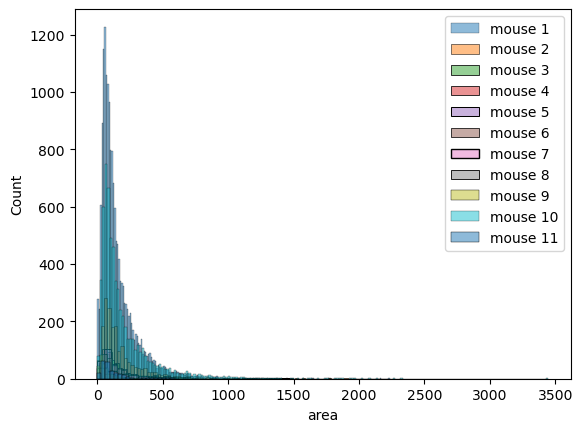

In [214]:
for i in range(1,12):
    sns.histplot(df[df['mouse_N']==i].area, label=f'mouse {i}', alpha =0.5)
    plt.legend()

### Merge dataframes and combine with metadata

In [181]:
glob.glob('/Volumes/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/sc_results_mouse*_w_bb.pkl')

['/Volumes/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/sc_results_mouse1_w_bb.pkl',
 '/Volumes/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/sc_results_mouse8_w_bb.pkl',
 '/Volumes/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/sc_results_mouse6_w_bb.pkl',
 '/Volumes/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/sc_results_mouse10_w_bb.pkl']

In [197]:
# 1. Load the first dataframe and assign 'mouse_1'
df = pd.read_pickle('/Volumes/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/sc_results_w_bb.pkl')
# df['mouse_N'] = ''
# df['rep_N'] = 1
# df['condition'] = ''

In [198]:
df

,zarr_address,region_id,mean_intensity_ch1,mean_intensity_ch2,area,bbox_rmin,bbox_rmax,bbox_cmin,bbox_cmax,mouse_N,rep_N,condition
16762,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,1,669.458333,1154.916667,72.0,12,28,24285,24311,2,1,DMSO
16763,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,2,394.212121,602.606061,33.0,31,46,25260,25278,2,1,DMSO
16764,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,3,613.163636,943.381818,55.0,43,59,25134,25166,2,1,DMSO
16765,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,4,737.836957,1462.576087,92.0,46,69,24763,24787,2,1,DMSO
16766,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,5,257.228070,396.228070,57.0,47,64,27340,27364,2,1,DMSO
...,...,...,...,...,...,...,...,...,...,...,...,...
397,20250901_40X_TimerMtb_BP_mice5_mice6_mice7_DAP...,398,121.763359,133.569975,393.0,31675,31709,9678,9711,6,1,RIF
398,20250901_40X_TimerMtb_BP_mice5_mice6_mice7_DAP...,399,123.785714,135.214286,14.0,31874,31889,9779,9793,6,1,RIF
399,20250901_40X_TimerMtb_BP_mice5_mice6_mice7_DAP...,400,142.280488,172.792683,82.0,33469,33495,10777,10804,6,1,RIF
400,20250901_40X_TimerMtb_BP_mice5_mice6_mice7_DAP...,401,133.342975,155.123967,242.0,33580,33612,7591,7626,6,1,RIF


In [199]:
# --- Initial Data Loading and Column Assignment ---



# List to hold all dataframes, starting with the primary one
dfs_to_concat = [df]

# --- Loop Loading and Column Assignment ---
for fn in ['/Volumes/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/sc_results_mouse10_w_bb.pkl']:
# glob.glob('/Volumes/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/sc_results_mouse*_w_bb.pkl'):
    # Load each dataframe
    # print(fn)
    # if 'mouse1' in fn:
    #     mouse_id = 1
    #     # print('yes')
    # else:
    #     mouse_id = ''
    # current_df = pd.read_pickle(fn)

    # 2. Assign the next mouse ID and initialize other columns
    current_df['mouse_N'] = 10#mouse_id
    current_df['rep_N'] = 1
    current_df['condition'] = 'PZA'

    # Add the loaded dataframe to the list
    dfs_to_concat.append(current_df)

# --- Final Concatenation ---
df = pd.concat(dfs_to_concat)

In [200]:
df

,zarr_address,region_id,mean_intensity_ch1,mean_intensity_ch2,area,bbox_rmin,bbox_rmax,bbox_cmin,bbox_cmax,mouse_N,rep_N,condition
16762,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,1,669.458333,1154.916667,72.0,12,28,24285,24311,2,1,DMSO
16763,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,2,394.212121,602.606061,33.0,31,46,25260,25278,2,1,DMSO
16764,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,3,613.163636,943.381818,55.0,43,59,25134,25166,2,1,DMSO
16765,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,4,737.836957,1462.576087,92.0,46,69,24763,24787,2,1,DMSO
16766,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,5,257.228070,396.228070,57.0,47,64,27340,27364,2,1,DMSO
...,...,...,...,...,...,...,...,...,...,...,...,...
6463,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,6460,1585.758929,562.026786,112.0,32209,32232,18276,18308,10,1,PZA
6464,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,6461,132.986547,115.771300,223.0,32369,32401,14248,14281,10,1,PZA
6465,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,6462,1783.888889,512.487654,162.0,33173,33209,15377,15405,10,1,PZA
6466,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,6463,148.725806,121.217742,124.0,33409,33440,24237,24266,10,1,PZA


In [202]:
df.to_pickle('/Volumes/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/rep1_sc_results_w_bb.pkl')

## Integrate condition information

### Add metadata

In [184]:
metadata = pd.read_pickle('/Volumes/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/metadata.pkl')
# only work with replicatae 1 for now
metadata = metadata[metadata['replicate']==1]
metadata

,mouse_num,replicate,condition,basename_stem
0,1,1,H2O,20250815_40X_TimerMtb_BP_mice1_DAPI_TimerG_Tim...
1,2,1,DMSO,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...
2,3,1,RIF,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...
3,4,1,RIF,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...
4,5,1,RIF,20250901_40X_TimerMtb_BP_mice5_mice6_mice7_DAP...
5,6,1,RIF,20250901_40X_TimerMtb_BP_mice5_mice6_mice7_DAP...
6,7,1,PZA,20250901_40X_TimerMtb_BP_mice5_mice6_mice7_DAP...
7,8,1,PZA,20250821_40X_TimerMtb_BP_mice8_mice9_DAPI_Time...
8,9,1,PZA,20250821_40X_TimerMtb_BP_mice8_mice9_DAPI_Time...
9,10,1,PZA,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...


In [192]:

for i, row in metadata.iterrows():
    mouse_N = row['mouse_num']
    replicate_N = row['replicate']
    condition = row['condition']
    basename = row['basename_stem']
    # if replicate_N ==2:
    #     continue
    # 1. Select all rows in df that match the basename
    # This result must be treated as a copy for safe assignment
    df_slice = df[df['zarr_address'].str.contains(basename, na=False)].copy()

    if mouse_N == 1:
        # Use .loc on the slice for assignment
        # The first argument is the row selector (boolean or index), 
        # the second is the column selector ('condition')
        df.loc[df_slice.index, 'condition'] = condition
        continue
    else:
        # For Mouse_N != 1, select rows that match both basename and mouse_N
        # We target the rows in the main DataFrame (df) directly using boolean indexing 
        # for maximum safety and performance.
        
        # Create a combined boolean mask
        mask = (df['zarr_address'].str.contains(basename, na=False)) & \
               (df['mouse_N'] == '')
        
        # Apply the assignment safely using .loc on the main DataFrame df
        df.loc[mask, 'condition'] = condition
        df.loc[mask, 'mouse_N'] = mouse_N

In [193]:
df[df['region_id']==1]

,zarr_address,region_id,mean_intensity_ch1,mean_intensity_ch2,area,bbox_rmin,bbox_rmax,bbox_cmin,bbox_cmax,mouse_N,rep_N,condition
16762,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,1,669.458333,1154.916667,72.0,12,28,24285,24311,2,1,DMSO
18674,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,1,113.709302,122.500000,86.0,1655,1679,12830,12855,3,1,RIF
19070,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,1,422.305556,701.527778,36.0,6803,6821,8715,8733,4,1,RIF
19525,20250901_40X_TimerMtb_BP_mice5_mice6_mice7_DAP...,1,110.944444,118.502924,1368.0,3119,3156,28364,28472,5,1,RIF
19879,20250901_40X_TimerMtb_BP_mice5_mice6_mice7_DAP...,1,0.000000,0.000000,44.0,1002,1018,23557,23578,7,1,PZA
19988,20250821_40X_TimerMtb_BP_mice8_mice9_DAPI_Time...,1,128.968750,120.218750,32.0,185,200,20397,20416,9,1,PZA
26761,20250901_40X_TimerMtb_BP_mice11_DAPI_TimerG_Ti...,1,110.783784,116.264865,185.0,1976,1997,26149,26189,11,1,DMSO
0,20250815_40X_TimerMtb_BP_mice1_DAPI_TimerG_Tim...,1,117.025641,115.333333,39.0,2019,2038,21217,21233,,1,H2O
0,20250821_40X_TimerMtb_BP_mice8_mice9_DAPI_Time...,1,0.000000,0.000000,118.0,988,1021,19591,19609,8,1,PZA
0,20250901_40X_TimerMtb_BP_mice5_mice6_mice7_DAP...,1,0.000000,0.000000,35.0,125,143,14610,14626,6,1,RIF


In [161]:
16758+6464

23222

In [201]:
for i, group in df.groupby(['mouse_N', 'rep_N', 'condition']):
    print('mouse_N:',group['mouse_N'].iloc[0], group['condition'].iloc[0],'length:',len(group))
    

mouse_N: 1 H2O length: 16758
mouse_N: 2 DMSO length: 1912
mouse_N: 3 RIF length: 396
mouse_N: 4 RIF length: 455
mouse_N: 5 RIF length: 354
mouse_N: 6 RIF length: 402
mouse_N: 7 PZA length: 109
mouse_N: 8 PZA length: 88
mouse_N: 9 PZA length: 309
mouse_N: 10 PZA length: 6468
mouse_N: 11 DMSO length: 243


# mouse_10 troubleshooting (solved)

In [164]:
len(df[df['mouse_N'] == 10]['region_id'].unique())

16762

In [167]:
# The columns defining the unique bounding box key
cols_to_check = ['area','bbox_rmin', 'bbox_rmax', 'bbox_cmin', 'bbox_cmax']

# 1. Define the keys (bounding boxes) that should be removed.
# Extract the unique bounding box combinations from 'mouse 1'. This is the source of truth.
keys_to_remove = df[df['mouse_N'] == 1][cols_to_check].drop_duplicates()

# 2. Prepare the keys for the anti-join by adding a temporary dummy column.
# This dummy column ensures we can detect a successful merge.
keys_to_remove = keys_to_remove.assign(_key_exists_=1)

# 3. Perform a Left Merge on the entire DataFrame with the keys to remove.
# A left merge will keep all rows from the original 'df'.
# Rows in 'df' that match a key in `keys_to_remove` will have a non-null value in '_key_exists_'.
merged_df = df.merge(
    keys_to_remove,
    on=cols_to_check,
    how='left'
)

# 4. Create the filter mask to keep the clean data.
# Keep a row if:
# - Its mouse_id is NOT 10 (i.e., data from mouse 1, 2, 3, etc., is retained).
# OR
# - Its mouse_id IS 10 AND the key was NOT found in the `keys_to_remove` (i.e., `_key_exists_` is null/NaN).
filter_mask = (merged_df['mouse_N'] != 10) | \
              ((merged_df['mouse_N'] == 10) & (merged_df['_key_exists_'].isna()))

# 5. Apply the filter to the original DataFrame to excise the contaminated rows.
df_cleaned = df[filter_mask]

/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_7123/2887710354.py:30: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_cleaned = df[filter_mask]


In [168]:
df_cleaned

,zarr_address,region_id,mean_intensity_ch1,mean_intensity_ch2,area,bbox_rmin,bbox_rmax,bbox_cmin,bbox_cmax,mouse_N,rep_N,condition
0,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,1,0.000000,0.000000,23.0,1267,1279,32515,32543,10,1,PZA
20,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,21,1678.166667,457.333333,24.0,3726,3741,42363,42381,10,1,PZA
16560,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,16561,1183.808482,345.425445,731.0,25889,25913,1639,1750,10,1,PZA
16761,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,16762,1141.125000,370.500000,8.0,29582,29593,31276,31294,10,1,PZA
16762,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,1,669.458333,1154.916667,72.0,12,28,24285,24311,2,1,DMSO
...,...,...,...,...,...,...,...,...,...,...,...,...
16560,20250815_40X_TimerMtb_BP_mice1_DAPI_TimerG_Tim...,16561,329.658333,164.583333,240.0,25936,25972,39438,39474,1,1,H2O
0,20250821_40X_TimerMtb_BP_mice8_mice9_DAPI_Time...,1,0.000000,0.000000,118.0,988,1021,19591,19609,8,1,PZA
20,20250821_40X_TimerMtb_BP_mice8_mice9_DAPI_Time...,21,634.214286,1087.000000,28.0,12730,12743,22374,22394,8,1,PZA
0,20250901_40X_TimerMtb_BP_mice5_mice6_mice7_DAP...,1,0.000000,0.000000,35.0,125,143,14610,14626,6,1,RIF


In [169]:
for i, group in df_cleaned.groupby(['mouse_N', 'rep_N', 'condition']):
    print('mouse_N:',group['mouse_N'].iloc[0], group['condition'].iloc[0],'length:',len(group))
    

mouse_N: 1 H2O length: 3
mouse_N: 2 DMSO length: 1912
mouse_N: 3 RIF length: 396
mouse_N: 4 RIF length: 455
mouse_N: 5 RIF length: 354
mouse_N: 6 RIF length: 2
mouse_N: 7 PZA length: 109
mouse_N: 8 PZA length: 2
mouse_N: 9 PZA length: 309
mouse_N: 10 PZA length: 6468
mouse_N: 11 DMSO length: 243


In [179]:
for i, group in test.groupby(['mouse_N', 'rep_N', 'condition']):
    print('mouse_N:',group['mouse_N'].iloc[0], group['condition'].iloc[0],'length:',len(group))
    

mouse_N: 1 H2O length: 16758
mouse_N: 2 DMSO length: 1912
mouse_N: 3 RIF length: 396
mouse_N: 4 RIF length: 455
mouse_N: 5 RIF length: 354
mouse_N: 6 RIF length: 402
mouse_N: 7 PZA length: 109
mouse_N: 8 PZA length: 88
mouse_N: 9 PZA length: 309
mouse_N: 11 DMSO length: 243


In [180]:
df[df['mouse_N']!=10].to_pickle('/Volumes/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/sc_results_w_bb.pkl')

In [176]:
df_cleaned[df_cleaned['mouse_N']==10].reset_index(drop=True).to_pickle('/Volumes/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/sc_results_mouse10_w_bb.pkl')

In [152]:
df[(df['area']==39) & (df['bbox_rmin']==2019)]

,zarr_address,region_id,mean_intensity_ch1,mean_intensity_ch2,area,bbox_rmin,bbox_rmax,bbox_cmin,bbox_cmax,mouse_N,rep_N,condition
1,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,2,0.000000,0.000000,39.0,2019,2038,21217,21233,10,1,PZA
0,20250815_40X_TimerMtb_BP_mice1_DAPI_TimerG_Tim...,1,117.025641,115.333333,39.0,2019,2038,21217,21233,1,1,H2O


In [158]:
import pandas as pd
import numpy as np
from pandas.core.arrays.sparse import array

# Assuming your DataFrame is named 'df'
# The columns you are interested in
cols_to_check = ['area','bbox_rmin', 'bbox_rmax', 'bbox_cmin', 'bbox_cmax']

# --- The Crux of the Operation ---
# 1. Create a structured numpy array from the specified columns.
dt = np.dtype([(c, df[c].dtype) for c in cols_to_check])
structured_array = df[cols_to_check].to_records(index=False).astype(dt)

# --- MODIFICATION START ---

# 2. Use NumPy's `unique` to find the duplicated indices.
#    Since we cannot create a Series directly, we must first find the unique keys and their indices.
_, inverse_indices, counts = np.unique(
    structured_array,
    return_inverse=True, # Returns the indices to reconstruct the original array from the unique array.
    return_counts=True   # Returns the counts of each unique element.
)

# 3. Use the counts array and the inverse indices to create the boolean mask.
#    counts[inverse_indices] maps the count of the unique group back to its original row position.
#    The `duplicate_mask` is True where the count is greater than 1 (meaning it's a duplicate).
duplicate_mask = counts[inverse_indices] > 1

# --- MODIFICATION END ---

# 4. Filter the original DataFrame to show only the duplicated rows.
df_duplicates = df[duplicate_mask]


In [160]:
33516/2

16758.0

In [159]:
df_duplicates

,zarr_address,region_id,mean_intensity_ch1,mean_intensity_ch2,area,bbox_rmin,bbox_rmax,bbox_cmin,bbox_cmax,mouse_N,rep_N,condition
1,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,2,0.000000,0.000000,39.0,2019,2038,21217,21233,10,1,PZA
2,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,3,120.315068,110.698630,146.0,2433,2459,22886,22916,10,1,PZA
3,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,4,883.984615,250.476923,65.0,2496,2524,32883,32908,10,1,PZA
4,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,5,0.000000,0.000000,91.0,2500,2521,9392,9419,10,1,PZA
5,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,6,0.000000,0.000000,50.0,2501,2521,9378,9400,10,1,PZA
...,...,...,...,...,...,...,...,...,...,...,...,...
16753,20250815_40X_TimerMtb_BP_mice1_DAPI_TimerG_Tim...,16754,122.194118,114.252941,170.0,28548,28574,34354,34385,1,1,H2O
16754,20250815_40X_TimerMtb_BP_mice1_DAPI_TimerG_Tim...,16755,889.397394,268.058632,307.0,28668,28713,36668,36710,1,1,H2O
16755,20250815_40X_TimerMtb_BP_mice1_DAPI_TimerG_Tim...,16756,2653.087591,756.379562,137.0,28732,28762,36719,36753,1,1,H2O
16756,20250815_40X_TimerMtb_BP_mice1_DAPI_TimerG_Tim...,16757,1125.614679,349.366972,109.0,29085,29107,35276,35306,1,1,H2O


In [148]:
for zarr_fn in tqdm(df['zarr_address'].unique()):
    print(zarr_fn)

  0%|          | 0/11 [00:00<?, ?it/s]

20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250814_5375.zarr
20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250901_5551.zarr
20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250901_5552.zarr
20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250901_5553.zarr
20250901_40X_TimerMtb_BP_mice5_mice6_mice7_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250903_5555.zarr
20250901_40X_TimerMtb_BP_mice5_mice6_mice7_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250903_5557.zarr
20250821_40X_TimerMtb_BP_mice8_mice9_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250822_5550.zarr
20250901_40X_TimerMtb_BP_mice11_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250902_5555.zarr
20250815_40X_TimerMtb_BP_mice1_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250815_5375.zarr
20250821_40X_TimerMtb_BP_mice8_mice9_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250822_5549.zarr
20250901_40X_TimerMtb_BP_m

# Plot

In [22]:
import seaborn as sns

In [215]:
df['timer_ratio'] = df['mean_intensity_ch1']/df['mean_intensity_ch2']

In [249]:
df.reset_index(drop=True, inplace=True)

In [251]:
df['x'] = (df['bbox_rmax'] - df['bbox_rmin'])//2 + df['bbox_rmin']		
df['y'] = (df['bbox_cmax'] - df['bbox_cmin'])//2 + df['bbox_cmin']	

In [257]:
df.to_pickle('/Volumes/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/sc_results_rep1.pkl')

<Axes: xlabel='mouse_N', ylabel='timer_ratio'>

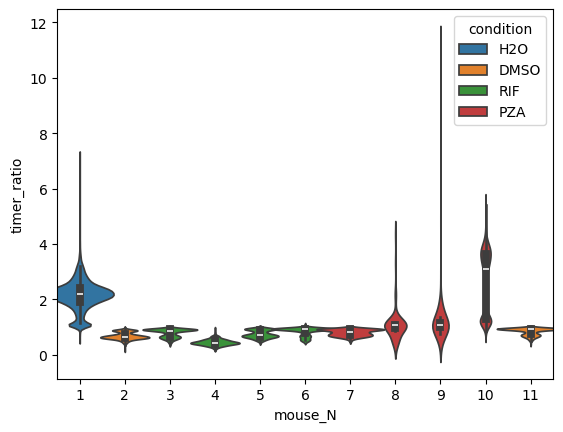

In [229]:
sns.violinplot(data=df.reset_index(drop=True), x='mouse_N', y='timer_ratio', hue='condition', width = 1.5)

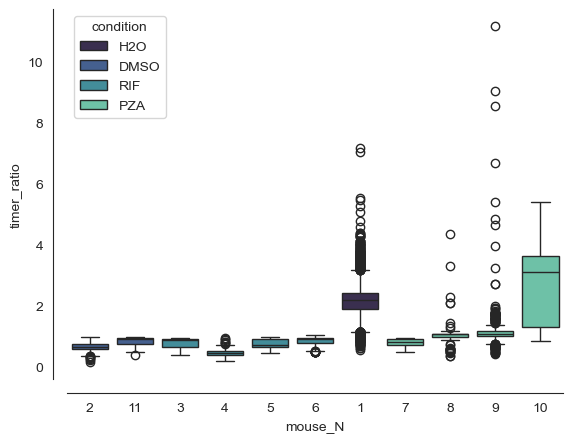

In [293]:

custom_order = [ '2', '11',  '3', '4', '5', '6', '1', '7', '8', '9', '10',]

# 2. Re-run the plot with the new 'order' parameter.
sns.boxplot(
    data=df.reset_index(drop=True),
    x='mouse_N', 
    y='timer_ratio', 
    hue='condition',
    width=0.8,
    order=custom_order, # <--- New argument to control x-axis sequence
    palette='mako'
)
# plt.ylim(0,6)
# Apply preferred plot aesthetics
sns.despine(offset=10)
plt.show()

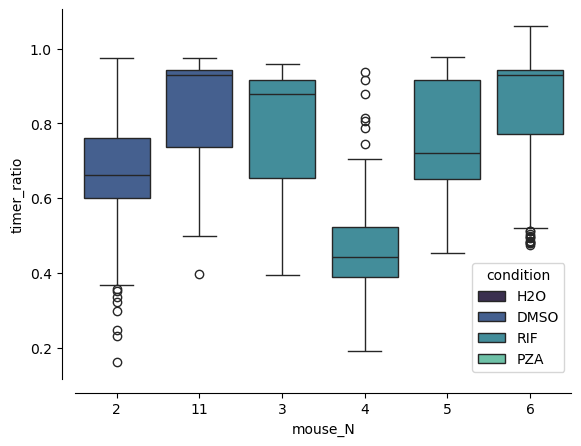

In [246]:
custom_order = [ '2', '11',  '3', '4', '5', '6',]#'1', '7', '8', '9', '10',]

# 2. Re-run the plot with the new 'order' parameter.
sns.boxplot(
    data=df.reset_index(drop=True),
    x='mouse_N', 
    y='timer_ratio', 
    hue='condition',
    width=0.8,
    order=custom_order, # <--- New argument to control x-axis sequence
    palette='mako'
)
# plt.ylim(0,6)
# Apply preferred plot aesthetics
sns.despine(offset=10)
plt.show()

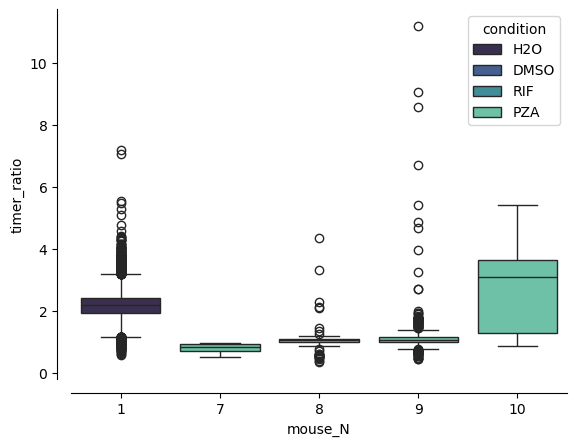

In [247]:
custom_order = [ '1', '7', '8', '9', '10',]

# 2. Re-run the plot with the new 'order' parameter.
sns.boxplot(
    data=df.reset_index(drop=True),
    x='mouse_N', 
    y='timer_ratio', 
    hue='condition',
    width=0.8,
    order=custom_order, # <--- New argument to control x-axis sequence
    palette='mako'
)
# plt.ylim(0,6)
# Apply preferred plot aesthetics
sns.despine(offset=10)
plt.show()

/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_7123/1291642493.py:5: UserWarning: 
The palette list has fewer values (6) than needed (11) and will cycle, which may produce an uninterpretable plot.
  sns.violinplot(


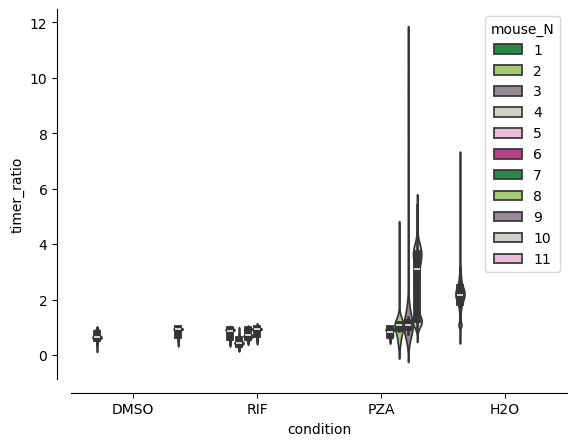

In [231]:
import seaborn as sns
import matplotlib.pyplot as plt

# Swap 'x' and 'hue' to group by 'condition' and use 'mouse_N' as the hue variable.
sns.violinplot(
    data=df.reset_index(drop=True),
    x='condition', 
    y='timer_ratio', 
    hue='mouse_N',
    # width=1.5,
    palette=['#1a9641', '#a6d96a', '#978897', '#d1d1ca', '#f1b6da', '#d02c91'] # Ensure full color list is used if mouse_N has many groups
)

# Apply preferred plot aesthetics
sns.despine(offset=10)
plt.show()

In [232]:
df.keys()

Index(['zarr_address', 'region_id', 'mean_intensity_ch1', 'mean_intensity_ch2',
       'area', 'bbox_rmin', 'bbox_rmax', 'bbox_cmin', 'bbox_cmax', 'mouse_N',
       'rep_N', 'condition', 'timer_ratio'],
      dtype='object')

### Area Mtb 

In [288]:
plot_data

,mouse_N,rep_N,condition,Percent_Area_Mtb,Percent_Area_Mtb_STD
0,1,1,H2O,0.216023,0.0
1,2,1,DMSO,0.023601,0.0
2,3,1,RIF,0.003982,0.0
3,4,1,RIF,0.058311,0.0
4,5,1,RIF,0.004095,0.0
5,6,1,RIF,0.004362,0.0
6,7,1,PZA,0.001953,0.0
7,8,1,PZA,0.001061,0.0
8,9,1,PZA,0.003827,0.0
9,10,1,PZA,0.097381,0.0


In [265]:
len(df['zarr_address'].unique())

11

/var/folders/8x/6gc_8nk523n3ry7gdlxbfzgs3msxj9/T/ipykernel_7123/17925534.py:79: UserWarning: The palette list has more values (5) than needed (4), which may not be intended.
  g = sns.barplot(


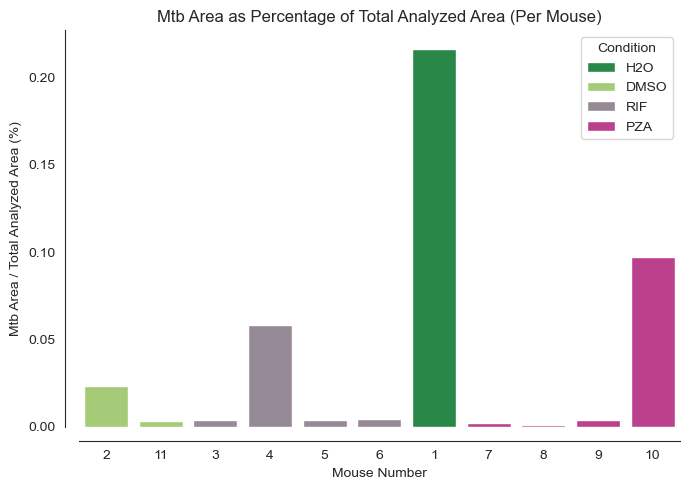

In [292]:

# ----------------------------------------------------------------------
# 1. CALCULATE TOTAL ANALYZED AREA PER ZARR ADDRESS (FIXED)
# Grouping MUST be done by the unique image identifier ('zarr_address').
# ----------------------------------------------------------------------

# Group by Zarr address to find the global (min/max) boundary of the analyzed area
bbox_summary = df.groupby('zarr_address').agg(
    # Find the smallest min-coordinate and the largest max-coordinate
    global_rmin=('bbox_rmin', 'min'),
    global_rmax=('bbox_rmax', 'max'),
    global_cmin=('bbox_cmin', 'min'),
    global_cmax=('bbox_cmax', 'max'),
    
    # Calculate the total Mtb area (sum of all region areas) for this Zarr file
    Area_Mtb=('area', 'sum')
).reset_index()

# Calculate the Total Analyzed Area (Total Height * Total Width)
bbox_summary['Total_Height'] = bbox_summary['global_rmax'] - bbox_summary['global_rmin']
bbox_summary['Total_Width'] = bbox_summary['global_cmax'] - bbox_summary['global_cmin']
bbox_summary['Total_Area_Analyzed'] = bbox_summary['Total_Height'] * bbox_summary['Total_Width']

# Clean up temporary columns
bbox_summary = bbox_summary.drop(
    columns=['global_rmin', 'global_rmax', 'global_cmin', 'global_cmax', 'Total_Height', 'Total_Width']
)

# ----------------------------------------------------------------------
# 2. MERGE AND CALCULATE AREA PERCENTAGE (FIXED)
# Merge MUST be done on 'zarr_address' to apply the area correctly per image.
# ----------------------------------------------------------------------

# Merge the total area data back into the original dataframe structure (using the unique Zarr file)
df_analysis = pd.merge(
    df[['zarr_address', 'mouse_N', 'rep_N', 'condition']].drop_duplicates(),
    bbox_summary,
    on='zarr_address', # REVERTED to zarr_address
    how='left'
)

# Calculate the percentage of the total analyzed area occupied by Mtb
df_analysis['Percent_Area_Mtb'] = (
    df_analysis['Area_Mtb'] / df_analysis['Total_Area_Analyzed']
) * 100

# ----------------------------------------------------------------------
# 3. AGGREGATE AND PLOT (FIXED FOR INDEXING ERROR)
# ----------------------------------------------------------------------

# 3a. Aggregate mean percentage
plot_data_mean = df_analysis.groupby(['mouse_N', 'rep_N', 'condition'], as_index=False)[['Percent_Area_Mtb']].mean()

# 3b. Aggregate standard deviation (STD) - Suppress FutureWarning for simplicity
with pd.option_context('future.no_silent_downcasting', True):
    plot_data_std = df_analysis.groupby(['mouse_N', 'rep_N', 'condition'], as_index=False)[['Percent_Area_Mtb']].std().fillna(0)
plot_data_std = plot_data_std.rename(columns={'Percent_Area_Mtb': 'Percent_Area_Mtb_STD'})

# 3c. MERGE MEAN and STD dataframes into a single, reliably indexed structure
plot_data = pd.merge(
    plot_data_mean, 
    plot_data_std, 
    on=['mouse_N', 'rep_N', 'condition'], 
    how='left'
)

# CRITICAL FIX: Sort plot_data to match the drawing order of Seaborn (X-axis major, Hue minor)
plot_data = plot_data.sort_values(by=['mouse_N', 'condition']).reset_index(drop=True)


# Define custom color palette (using user's preferred colors)
custom_palette = ['#1a9641', '#a6d96a', '#978897', '#d02c91', '#f1b6da'] 
condition_order = ['H2O', 'DMSO', 'RIF', 'PZA', ] # Include all potential conditions

# Initialize the plot
plt.figure(figsize=(7, 5)) # Increased figure size for more mice
sns.set_style("white")

# Create the bar plot (Mouse_N on X-axis, HUE by Condition, Dodge enabled)
g = sns.barplot(
    data=plot_data,
    x='mouse_N', 
    y='Percent_Area_Mtb',
    hue='condition', # Coloring by condition
    palette=custom_palette, 
    hue_order=condition_order,
    order=[2,11,3,4,5,6,1, 7,8,9,10,],
    errorbar=None, 
    capsize=0.4,
    dodge=False 
)

# Final Plot Aesthetics
sns.despine(offset=10,)
plt.title('Mtb Area as Percentage of Total Analyzed Area (Per Mouse)')
plt.ylabel('Mtb Area / Total Analyzed Area (%)')
plt.xlabel('Mouse Number')
plt.legend(title='Condition')
plt.tight_layout()
plt.show()

## Heatmap visualisation

In [6]:
df = pd.read_pickle('/mnt/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/sc_results_w_bb.pkl')

In [7]:
df['timer_ratio'] = df['mean_intensity_ch1']/df['mean_intensity_ch2']

In [37]:
for i, group in df.groupby('zarr_address'):
    print(group['zarr_address'].iloc[0])
    print(len(group))

20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250814_5375.zarr
23226
20250821_40X_TimerMtb_BP_mice8_mice9_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250822_5550.zarr
309
20250901_40X_TimerMtb_BP_mice11_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250902_5555.zarr
243
20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250901_5551.zarr
1912
20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250901_5552.zarr
396
20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250901_5553.zarr
455
20250901_40X_TimerMtb_BP_mice5_mice6_mice7_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250903_5555.zarr
354
20250901_40X_TimerMtb_BP_mice5_mice6_mice7_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250903_5557.zarr
109


In [39]:
subset_df = df[df['zarr_address']=='20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250901_5551.zarr']

In [40]:
subset_df

,zarr_address,region_id,mean_intensity_ch1,mean_intensity_ch2,area,bbox_rmin,bbox_rmax,bbox_cmin,bbox_cmax,timer_ratio
16762,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,1,669.458333,1154.916667,72.0,12,28,24285,24311,0.579659
16763,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,2,394.212121,602.606061,33.0,31,46,25260,25278,0.654179
16764,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,3,613.163636,943.381818,55.0,43,59,25134,25166,0.649963
16765,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,4,737.836957,1462.576087,92.0,46,69,24763,24787,0.504478
16766,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,5,257.228070,396.228070,57.0,47,64,27340,27364,0.649192
...,...,...,...,...,...,...,...,...,...,...
18669,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,1908,114.215094,123.305660,265.0,31757,31790,30643,30690,0.926276
18670,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,1909,113.428571,122.548701,308.0,31840,31882,30387,30422,0.925580
18671,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,1910,317.565401,491.603376,237.0,32828,32869,16364,16390,0.645979
18672,20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAP...,1911,116.030357,128.687500,560.0,32887,32934,16392,16436,0.901644


In [11]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import numpy as np # Used only for dummy data if file fails

In [8]:
df['x'] = (df['bbox_rmax'] - df['bbox_rmin'])//2 + df['bbox_rmin']		
df['y'] = (df['bbox_cmax'] - df['bbox_cmin'])//2 + df['bbox_cmin']		

In [9]:
df

,zarr_address,region_id,mean_intensity_ch1,mean_intensity_ch2,area,bbox_rmin,bbox_rmax,bbox_cmin,bbox_cmax,timer_ratio,x,y
0,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,1,0.000000,0.000000,23.0,1267,1279,32515,32543,NaN,1273,32529
1,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,2,0.000000,0.000000,39.0,2019,2038,21217,21233,NaN,2028,21225
2,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,3,120.315068,110.698630,146.0,2433,2459,22886,22916,1.086870,2446,22901
3,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,4,883.984615,250.476923,65.0,2496,2524,32883,32908,3.529206,2510,32895
4,20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...,5,0.000000,0.000000,91.0,2500,2521,9392,9419,NaN,2510,9405
...,...,...,...,...,...,...,...,...,...,...,...,...
26999,20250901_40X_TimerMtb_BP_mice11_DAPI_TimerG_Ti...,239,137.860759,158.700422,237.0,36480,36503,21175,21213,0.868686,36491,21194
27000,20250901_40X_TimerMtb_BP_mice11_DAPI_TimerG_Ti...,240,109.032258,114.903226,62.0,36519,36544,16639,16654,0.948905,36531,16646
27001,20250901_40X_TimerMtb_BP_mice11_DAPI_TimerG_Ti...,241,302.518325,407.848168,191.0,36544,36574,20714,20741,0.741743,36559,20727
27002,20250901_40X_TimerMtb_BP_mice11_DAPI_TimerG_Ti...,242,110.038760,117.930233,129.0,36584,36601,14265,14296,0.933084,36592,14280


In [15]:
for i, group in df.groupby('zarr_address'):
    print(i, group)
    break

20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250814_5375.zarr                                             zarr_address  region_id  \
0      20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...          1   
1      20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...          2   
2      20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...          3   
3      20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...          4   
4      20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...          5   
...                                                  ...        ...   
26756  20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...       6460   
26757  20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...       6461   
26758  20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...       6462   
26759  20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...       6463   
26760  20250814_40X_TimerMtb_BP_mice10_DAPI_TimerG_Ti...       6464   

       mean_intensity_ch1  mean_intensity_ch2   area  bb

In [21]:
expt_ID = i.split('_')[-1].split('.')[0]

'5375'

In [35]:
# Imports needed for this operation
import os
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import FormatStrFormatter
# import pandas as pd # Assuming 'df' is a loaded DataFrame

# --- Code Modifications ---

# 1. Define physical scale constants based on metadata.
# From "Physical pixel size" (0.1625) and "units" (10^-6m^1).
PIXEL_SIZE_UM = 0.1625  # micrometres per pixel
PIXEL_SCALE_MM = PIXEL_SIZE_UM / 1000.0  # millimetres per pixel

# Create the output directory if it doesn't exist.
os.makedirs('heatmaps', exist_ok=True)

for i, group in df.groupby('zarr_address'):
    expt_ID = i.split('_')[-1].split('.')[0]
    
    # Use the specified style context
    plt.style.use('seaborn-v0_8-whitegrid')
    
    # 2. Define the target number of bins for the grid.
    TARGET_BINS = 100
    
    # 3. Calculate spatial extent in pixels.
    x_min, x_max = group['x'].min(), group['x'].max()
    y_min, y_max = group['y'].min(), group['y'].max()
    
    data_range = max(x_max - x_min, y_max - y_min) + 1e-6
    # BIN_SIZE is calculated in pixels
    BIN_SIZE = data_range / TARGET_BINS
    
    if BIN_SIZE < 1e-5:
        print(f"Skipping {expt_ID}: Data has zero spatial extent.")
        continue

    # 4. Create binned coordinate columns (still in pixel-based bin indices).
    group['y_bin'] = ((-group['x'] - x_min) // BIN_SIZE).astype(int)
    group['x_bin'] = ((group['y'] - y_min) // BIN_SIZE).astype(int)
    
    # 5. Aggregate the data by the new bins.
    binned_data = group.groupby(['y_bin', 'x_bin'])['timer_ratio'].mean()
    
    # 6. Pivot the data into a 2D matrix.
    heatmap_matrix = binned_data.unstack(level='x_bin')
    
    # 7. Relabel the axes to reflect physical units (mm).
    # First, calculate the pixel coordinate for the center/edge of the bin.
    pixel_coords_x = (heatmap_matrix.columns * BIN_SIZE + x_min)
    pixel_coords_y = (heatmap_matrix.index * BIN_SIZE + y_min)
    
    # Now, convert pixel coordinates to millimetres.
    # The index/columns are now float values representing mm.
    heatmap_matrix.columns = pixel_coords_x * PIXEL_SCALE_MM
    heatmap_matrix.index = pixel_coords_y * PIXEL_SCALE_MM
    
    # 8. Plot the heatmap.
    plt.figure(figsize=(12, 10))
    
    # Calculate dynamic tick frequency.
    x_tick_frequency = max(1, len(heatmap_matrix.columns) // 10)
    y_tick_frequency = max(1, len(heatmap_matrix.index) // 10)
    
    ax = sns.heatmap(
        heatmap_matrix,
        annot=False,
        cmap='PiYG',
        linewidths=0.5,
        linecolor='#cccccc',
        cbar_kws={'label': 'Mean Timer Ratio'},
        xticklabels=x_tick_frequency,
        yticklabels=y_tick_frequency
    )
    
    # 9. Format the tick labels to 2 decimal places (for mm).
    ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    ax.yaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    
    # 10. Apply styling preferences.
    physical_bin_size_mm = BIN_SIZE * PIXEL_SCALE_MM
    title = (
        f'Dynamic Heatmap (ID: {expt_ID})\n'
        f'Physical Bin Size: {physical_bin_size_mm:.2f} x {physical_bin_size_mm:.2f} mm'
    )
    ax.set_title(title)
    ax.set_xlabel('X Coordinate (mm)')
    ax.set_ylabel('Y Coordinate (mm)')
    ax.tick_params(axis='x', rotation=90)
    
    # Set background and apply despine
    ax.set_facecolor('white')
    sns.despine(offset=10, trim=True)
    
    # Ensure layout is tight and save the figure.
    plt.tight_layout()
    save_path = f'heatmaps/dynamic_heatmap_mm_ID{expt_ID}.png'
    plt.savefig(save_path)
    plt.close() # Close figure to free memory
    print(f"Dynamic heatmap saved as '{save_path}'")

Dynamic heatmap saved as 'heatmaps/dynamic_heatmap_mm_ID5375.png'
Dynamic heatmap saved as 'heatmaps/dynamic_heatmap_mm_ID5550.png'
Dynamic heatmap saved as 'heatmaps/dynamic_heatmap_mm_ID5555.png'
Dynamic heatmap saved as 'heatmaps/dynamic_heatmap_mm_ID5551.png'
Dynamic heatmap saved as 'heatmaps/dynamic_heatmap_mm_ID5552.png'
Dynamic heatmap saved as 'heatmaps/dynamic_heatmap_mm_ID5553.png'
Dynamic heatmap saved as 'heatmaps/dynamic_heatmap_mm_ID5555.png'
Dynamic heatmap saved as 'heatmaps/dynamic_heatmap_mm_ID5557.png'


## Images

In [60]:
zarr_address = glob.glob('/mnt/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/whole_slice/mouse_*/zarr/*5551.zarr')[0]

In [61]:
print(zarr_address)

/mnt/OPERA3/Nathan/data/macrohet/mtb_tissue_localisation/whole_slice/mouse_2/zarr/20250901_40X_TimerMtb_BP_mice2_mice3_mice4_DAPI_TimerG_TimerR_Multichannel Z-Stack_20250901_5551.zarr


/home/dayn/miniconda3/envs/godspee/lib/python3.11/site-packages/napari/_vispy/layers/scalar_field.py:197: UserWarning: data shape (41702, 58291) exceeds GL_MAX_TEXTURE_SIZE 32768 in at least one axis and will be downsampled. Rendering is currently in 2D mode.
  warnings.warn(


In [62]:

# --- load image (full-res level) ---
img = da.from_zarr(f"{zarr_address}/0/0")    # adjust path if your top-level differs

# # --- load label ---
# lbl = da.from_zarr(f"{zarr_address}/labels/ground_truth_mtb/0")


In [63]:
img.shape

(1, 3, 11, 37555, 49997)

In [65]:
viewer = napari.Viewer(title = 'heatmap')
viewer.open(Path(zarr_address,'0'), channel_axis=1)   # napari-ome-zarr plugin
# viewer.open(Path(zarr_address, 'labels', 'ground_truth_mtb'))


# # --- show in napari ---
# viewer = napari.Viewer()
# viewer.add_image(img, name="image")
# viewer.add_labels(lbl, name="ground_truth_mtb")
# napari.run()


[<Image layer '0' at 0x771d6a7b3ad0>,
 <Image layer '0 [1]' at 0x771ccc47bf10>,
 <Image layer '0 [2]' at 0x771ccc4a6d50>]

In [67]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import numpy as np
import matplotlib.cm as cm # Needed for 'rocket' cmap

In [68]:
# --- 1. Define Constants ---

# The exact dimensions of your source image
IMG_HEIGHT = 37555
IMG_WIDTH = 49997

# The spatial bin size, as specified in your code.
BIN_SIZE = 500

# The global transparency of the overlay (0.0 to 1.0)
OVERLAY_ALPHA = 0.7

# The DPI for rendering.
FIG_DPI = 100

# --- 2. Load Data ---
# (DataFrame 'df' is assumed to be loaded and in scope, as requested)
print(f"Using pre-loaded DataFrame with BIN_SIZE={BIN_SIZE}")

# --- 3. Bin Data and Create Full-Sized Matrix ---

# Create binned coordinate columns
df['x_bin'] = df['x'] // BIN_SIZE
df['y_bin'] = df['y'] // BIN_SIZE

# Group by the new bin indices and calculate the mean
binned_data = df.groupby(['y_bin', 'x_bin'])['timer_ratio'].mean()

# Pivot the data into a 2D matrix
heatmap_matrix = binned_data.unstack(level='x_bin')

# Define the full index range based on image dimensions
num_bins_x = int(np.ceil(IMG_WIDTH / BIN_SIZE))
num_bins_y = int(np.ceil(IMG_HEIGHT / BIN_SIZE))

x_bins_index = pd.RangeIndex(start=0, stop=num_bins_x, name='x_bin')
y_bins_index = pd.RangeIndex(start=0, stop=num_bins_y, name='y_bin')

# Reindex the matrix to ensure it has the full
# (num_bins_y, num_bins_x) shape, filling missing bins with NaN
heatmap_matrix = heatmap_matrix.reindex(index=y_bins_index, columns=x_bins_index)

# Get the raw NumPy array for plotting
ratio_matrix = heatmap_matrix.values

# Get data range for the colormap, ignoring NaNs
min_val = np.nanmin(ratio_matrix)
max_val = np.nanmax(ratio_matrix)

print(f"Created binned matrix of shape: {ratio_matrix.shape}")

# --- 4. Configure Colormap ---

# Get the 'rocket' colormap object
custom_cmap = cm.get_cmap('rocket')

# CRITICAL: Instruct the colormap to render NaN values as fully transparent
# We copy the colormap to avoid modifying the global matplotlib state
custom_cmap = custom_cmap.copy()
custom_cmap.set_bad(color=(0, 0, 0, 0))

# --- 5. Configure Figure and Render Image ---

# Calculate the figure size in inches to match the exact pixel dimensions
fig_width_inches = IMG_WIDTH / FIG_DPI
fig_height_inches = IMG_HEIGHT / FIG_DPI

# Create the figure
plt.figure(figsize=(fig_width_inches, fig_height_inches), dpi=FIG_DPI)

# Create an axes object that fills the entire figure (no padding)
ax = plt.axes([0, 0, 1, 1])

# Use imshow to render the binned matrix
# 'interpolation="nearest"' ensures sharp, blocky bins
# 'aspect="auto"' stretches the bins to fill the axes
ax.imshow(
    ratio_matrix,
    cmap=custom_cmap,
    alpha=OVERLAY_ALPHA,
    interpolation='nearest',
    aspect='auto',
    vmin=min_val,
    vmax=max_val
)

# Turn off all axes, labels, and ticks
ax.axis('off')

# --- 6. Save the Transparent PNG ---

# 'transparent=True' makes the figure background transparent
# 'pad_inches=0' and 'bbox_inches="tight"' remove all whitespace
plt.savefig(
    'heatmap_overlay_rocket.png',
    transparent=True,
    pad_inches=0,
    bbox_inches='tight',
    dpi=FIG_DPI
)

print(f"Transparent overlay saved as 'heatmap_overlay_rocket.png' ({IMG_WIDTH}x{IMG_HEIGHT} pixels)")

Using pre-loaded DataFrame with BIN_SIZE=500
Created binned matrix of shape: (76, 100)


/tmp/ipykernel_56322/595955366.py:55: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  custom_cmap = cm.get_cmap('rocket')


Transparent overlay saved as 'heatmap_overlay_rocket.png' (49997x37555 pixels)


In [69]:
from skimage import io

In [70]:
heatmap = io.imread('heatmap_overlay_rocket.png')

DecompressionBombError: Image size (1877637335 pixels) exceeds limit of 178956970 pixels, could be decompression bomb DOS attack.